<a href="https://colab.research.google.com/github/anamaria2204/AI_Homework/blob/main/Lab4_AI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install azure-cognitiveservices-vision-computervision
!pip install pillow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.9/198.9 kB 13.0 MB/s eta 0:00:00


In [ ]:
from azure.cognitiveservices.vision.computervision import ComputerVisionClient
from azure.cognitiveservices.vision.computervision.models import OperationStatusCodes
from azure.cognitiveservices.vision.computervision.models import VisualFeatureTypes
from msrest.authentication import CognitiveServicesCredentials
from array import array
import os
import io
from PIL import Image
import sys
import time
import requests
import json

In [ ]:
def autentification():
  """
  Determina autentificarea
  :return: computervision_client - obiectul de autentificare
  """
  os.environ["VISION_API_KEY"] = "CrkPcmCb7BCJSH0m3shaWM7BcfTqSm0CRU94OmDIAE7KGl5uDbG3JQQJ99BCACi5YpzXJ3w3AAAFACOGlqGP"
  os.environ["VISION_API_ENDPOINT"] = "https://laboratory.cognitiveservices.azure.com/"

  subscription_key = os.environ.get("VISION_API_KEY")
  endpoint = os.environ.get("VISION_API_ENDPOINT")

  computervision_client = ComputerVisionClient(endpoint, CognitiveServicesCredentials(subscription_key))
  return computervision_client

computervision_client = autentification()

# Problema 1


In [ ]:
def get_read_result_from_image(image_url):
    """
    Descarcă o imagine de la un URL și obține rezultatul de la Azure Computer Vision.
    :param image_url: URL-ul imaginii
    :return: Rezultatul returnat de computervision_client.get_read_result
    """
    response = requests.get(image_url)
    if response.status_code == 200:
        img = io.BytesIO(response.content)
    else:
        raise Exception("Eroare la descărcarea imaginii!")

    read_response = computervision_client.read_in_stream(
        image=img,
        mode="Printed",
        raw=True
    )

    operation_id = read_response.headers['Operation-Location'].split('/')[-1]
    while True:
        read_result = computervision_client.get_read_result(operation_id)
        if read_result.status not in ['notStarted', 'running']:
            break
        time.sleep(1)

    return read_result

In [ ]:
def get_raw_image_urls_manually(repo_owner, repo_name, branch, folder_path, image_extensions=('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
    api_url = f"https://api.github.com/repos/{repo_owner}/{repo_name}/contents/{folder_path}"
    response = requests.get(api_url)
    if response.status_code != 200:
        raise Exception(f"Eroare la accesarea folderului: {response.status_code}")

    files = response.json()
    raw_image_urls = [
        f"https://raw.githubusercontent.com/{repo_owner}/{repo_name}/{branch}/{folder_path}/{file['name']}"
        for file in files if file['type'] == 'file' and file['name'].lower().endswith(image_extensions)
    ]

    return raw_image_urls

In [ ]:
def classify_image_with_azure(image_url):
    """
    Clasifică o imagine utilizând Azure Computer Vision.
    :param image_url: URL-ul imaginii
    :return: Eticheta dominantă și probabilitatea
    """
    analysis = computervision_client.analyze_image(image_url, visual_features=["Tags"])

    for tag in analysis.tags:
        if tag.name.lower() in ["bicycle", "bike"]:
            return 1

    return 0

In [ ]:
repo_owner = 'lauradiosan'
repo_name = 'AI-UBB'
branch = 'main'
folder_path = '2024-2025/labs/lab04/images/bikes'

raw_image_urls = get_raw_image_urls_manually(repo_owner, repo_name, branch, folder_path)
y_true = [1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0]

In [ ]:
!pip install scikit-learn

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from io import BytesIO
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

In [ ]:
assert len(y_true) == len(raw_image_urls)
y_pred = [classify_image_with_azure(url) for url in raw_image_urls]

accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

print(f"Acuratețe: {accuracy:.2f}")
print(f"Precizie: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-score: {f1:.2f}")

Acuratețe: 1.00
Precizie: 1.00
Recall: 1.00
F1-score: 1.00


# Problema 2


In [ ]:
def contains_bicycle(image_url):
    analysis = computervision_client.analyze_image(image_url, visual_features=["Objects"])
    for obj in analysis.objects:
        if obj.object_property.lower() in ["bicycle", "bike"]:
            return True
    return False

def save_bicycle_images(image_urls, save_folder="bikes_detected"):
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    for image_url in image_urls:
        print(f"Analizăm {image_url}...")
        if contains_bicycle(image_url):
            response = requests.get(image_url)
            if response.status_code == 200:
                image_name = image_url.split("/")[-1]
                image_path = os.path.join(save_folder, image_name)

                with open(image_path, "wb") as file:
                    file.write(response.content)
                print(f"Bicicletă detectată! Imagine salvată: {image_path}")
            else:
                print(f"Eroare la descărcarea {image_url}")


In [ ]:
save_bicycle_images(raw_image_urls)

Analizăm https://raw.githubusercontent.com/lauradiosan/AI-UBB/main/2024-2025/labs/lab04/images/bikes/bike02.jpg...
Bicicletă detectată! Imagine salvată: bikes_detected/bike02.jpg
Analizăm https://raw.githubusercontent.com/lauradiosan/AI-UBB/main/2024-2025/labs/lab04/images/bikes/bike03.jpg...
Bicicletă detectată! Imagine salvată: bikes_detected/bike03.jpg
Analizăm https://raw.githubusercontent.com/lauradiosan/AI-UBB/main/2024-2025/labs/lab04/images/bikes/bike04.jpg...
Bicicletă detectată! Imagine salvată: bikes_detected/bike04.jpg
Analizăm https://raw.githubusercontent.com/lauradiosan/AI-UBB/main/2024-2025/labs/lab04/images/bikes/bike05.jpg...
Bicicletă detectată! Imagine salvată: bikes_detected/bike05.jpg
Analizăm https://raw.githubusercontent.com/lauradiosan/AI-UBB/main/2024-2025/labs/lab04/images/bikes/bike06.jpg...
Analizăm https://raw.githubusercontent.com/lauradiosan/AI-UBB/main/2024-2025/labs/lab04/images/bikes/bike07.jpg...
Bicicletă detectată! Imagine salvată: bikes_detected/b

Procesăm: bike1.jpg
Procesăm: bike03.jpg
Procesăm: bike06.jpg
Procesăm: bike09.jpg
Procesăm: bike07.jpg
Procesăm: bike08.jpg
Procesăm: bike05.jpg
Procesăm: bike04.jpg
Procesăm: bike10.jpg
Procesăm: bike02.jpg


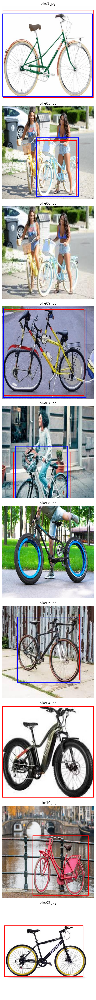

In [ ]:
import os
import json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image, ImageDraw

data = [
    ("bike1.jpg", 2, 33, 407, 372),
    ("bike03.jpg", 155, 140, 190, 265),
    ("bike09.jpg", 5, 7, 375, 405),
    ("bike07.jpg",  60, 180, 235, 240),
    ("bike05.jpg", 68, 50, 285, 295)
]

def detect_bicycle_and_draw_box(image_path):
    with open(image_path, "rb") as image_file:
        analysis = computervision_client.analyze_image_in_stream(image_file, visual_features=["Objects"])

    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    bicycle_detected = False
    azure_boxes = []

    for obj in analysis.objects:
        if obj.object_property.lower() in ["bicycle", "bike"]:
            bicycle_detected = True
            x, y, w, h = obj.rectangle.x, obj.rectangle.y, obj.rectangle.w, obj.rectangle.h
            azure_boxes.append((x, y, w, h))
            draw.rectangle([x, y, x + w, y + h], outline="red", width=3)

    return image, azure_boxes

def process_all_images(folder="bikes_detected"):
    if not os.path.exists(folder):
        print(f"Folderul {folder} nu există!")
        return

    images = os.listdir(folder)
    processed_images = []

    for image_name in images:
        image_path = os.path.join(folder, image_name)
        print(f"Procesăm: {image_name}")
        image, azure_boxes = detect_bicycle_and_draw_box(image_path)

        for img_name, x, y, w, h in data:
            if img_name == image_name:
                draw = ImageDraw.Draw(image)
                draw.rectangle([x, y, x + w, y + h], outline="blue", width=3)
        processed_images.append((image_name, image))

    if processed_images:
        fig, axes = plt.subplots(len(processed_images), 1, figsize=(6, len(processed_images) * 5))
        if len(processed_images) == 1:
            axes = [axes]

        for ax, (name, img) in zip(axes, processed_images):
            ax.imshow(img)
            ax.set_title(name)
            ax.axis("off")

        plt.tight_layout()
        plt.show()
    else:
        print("Nu s-au găsit imagini în folder!")

process_all_images()


Procesăm: bike1.jpg


IntText(value=50, description='X:')

IntText(value=50, description='Y:')

IntText(value=100, description='Lățime:')

IntText(value=100, description='Înălțime:')

Button(description='Desenează', style=ButtonStyle())

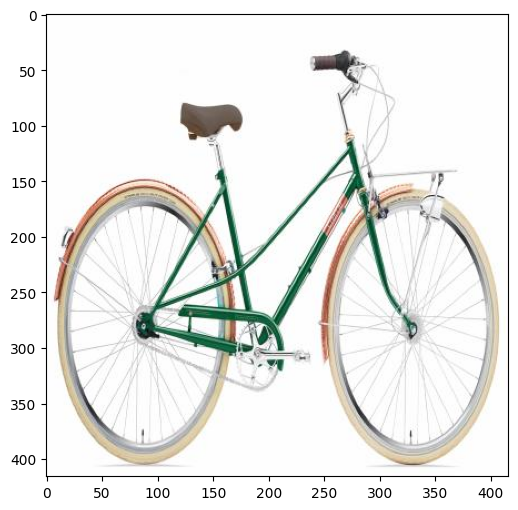

Procesăm: bike03.jpg


IntText(value=50, description='X:')

IntText(value=50, description='Y:')

IntText(value=100, description='Lățime:')

IntText(value=100, description='Înălțime:')

Button(description='Desenează', style=ButtonStyle())

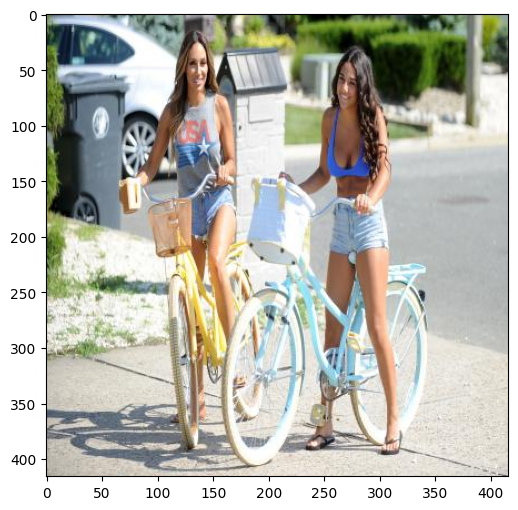

Procesăm: bike06.jpg


IntText(value=50, description='X:')

IntText(value=50, description='Y:')

IntText(value=100, description='Lățime:')

IntText(value=100, description='Înălțime:')

Button(description='Desenează', style=ButtonStyle())

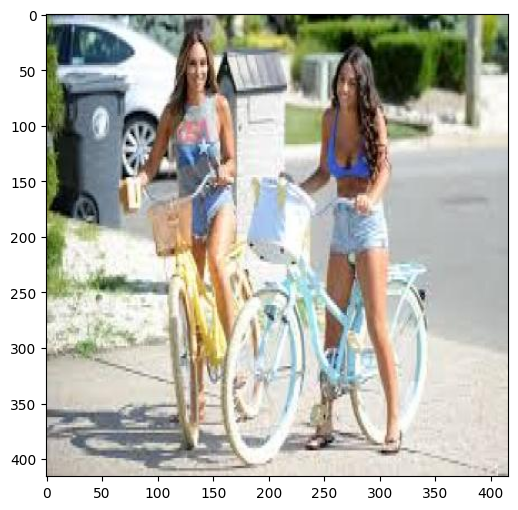

Procesăm: bike09.jpg


IntText(value=50, description='X:')

IntText(value=50, description='Y:')

IntText(value=100, description='Lățime:')

IntText(value=100, description='Înălțime:')

Button(description='Desenează', style=ButtonStyle())

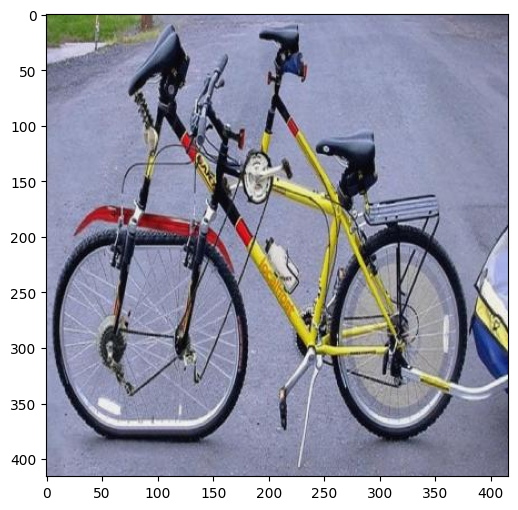

Procesăm: bike07.jpg


IntText(value=50, description='X:')

IntText(value=50, description='Y:')

IntText(value=100, description='Lățime:')

IntText(value=100, description='Înălțime:')

Button(description='Desenează', style=ButtonStyle())

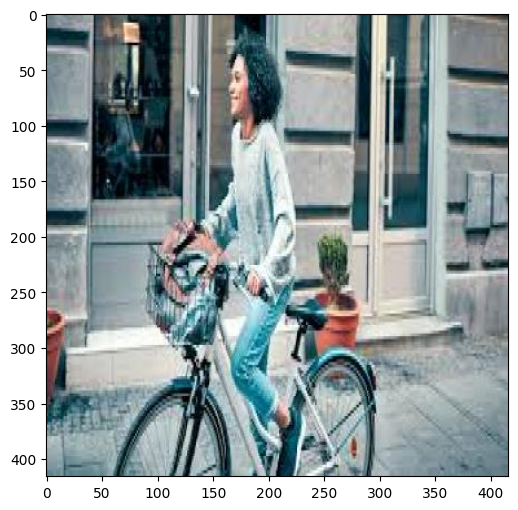

Procesăm: bike08.jpg


IntText(value=50, description='X:')

IntText(value=50, description='Y:')

IntText(value=100, description='Lățime:')

IntText(value=100, description='Înălțime:')

Button(description='Desenează', style=ButtonStyle())

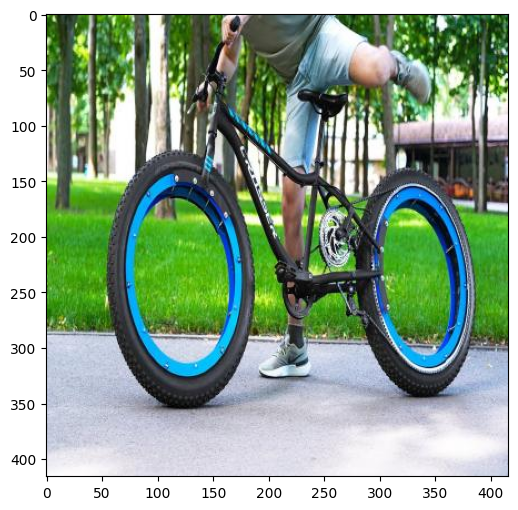

Procesăm: bike05.jpg


IntText(value=50, description='X:')

IntText(value=50, description='Y:')

IntText(value=100, description='Lățime:')

IntText(value=100, description='Înălțime:')

Button(description='Desenează', style=ButtonStyle())

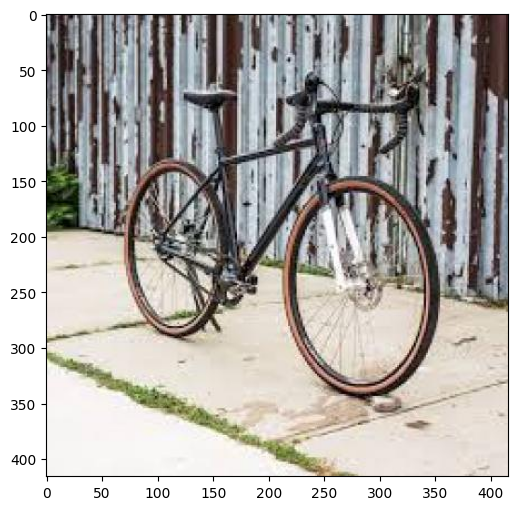

Procesăm: bike04.jpg


IntText(value=50, description='X:')

IntText(value=50, description='Y:')

IntText(value=100, description='Lățime:')

IntText(value=100, description='Înălțime:')

Button(description='Desenează', style=ButtonStyle())

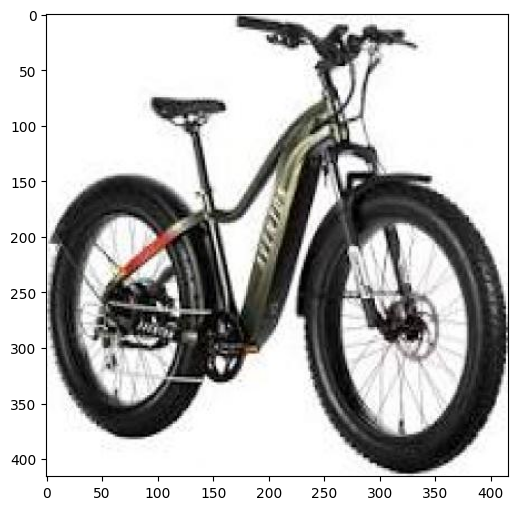

Procesăm: bike10.jpg


IntText(value=50, description='X:')

IntText(value=50, description='Y:')

IntText(value=100, description='Lățime:')

IntText(value=100, description='Înălțime:')

Button(description='Desenează', style=ButtonStyle())

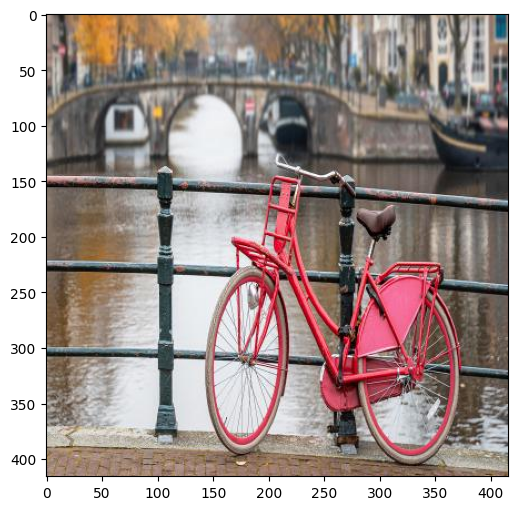

Procesăm: bike02.jpg


IntText(value=50, description='X:')

IntText(value=50, description='Y:')

IntText(value=100, description='Lățime:')

IntText(value=100, description='Înălțime:')

Button(description='Desenează', style=ButtonStyle())

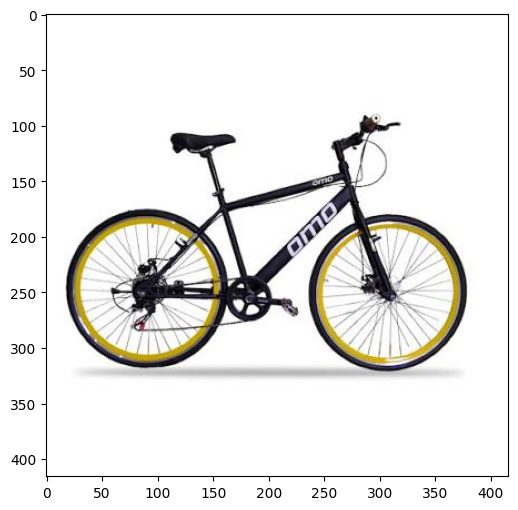

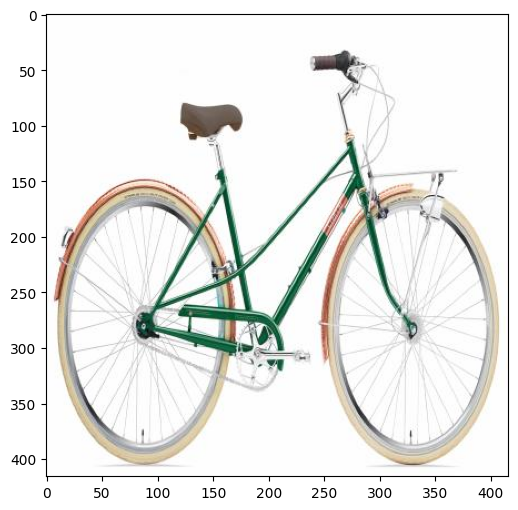

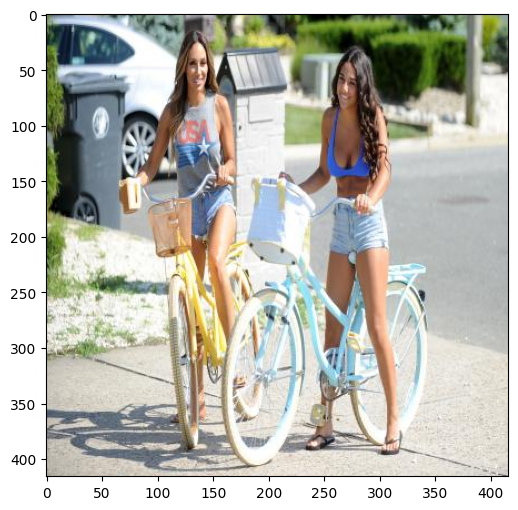

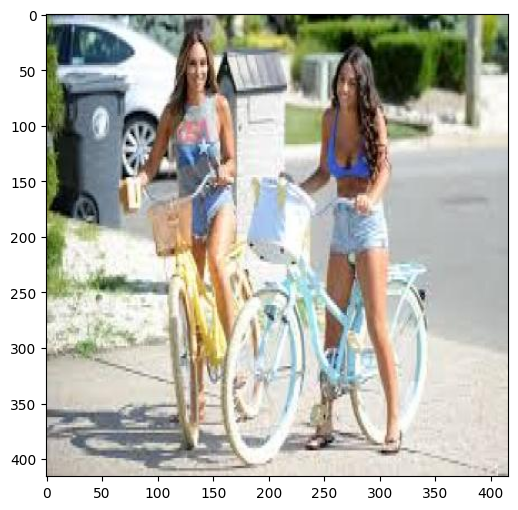

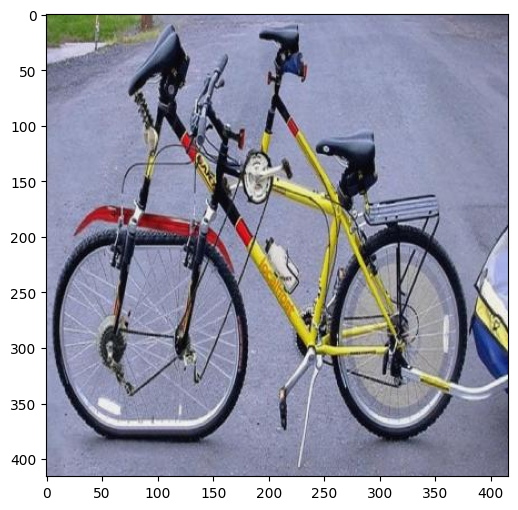

...

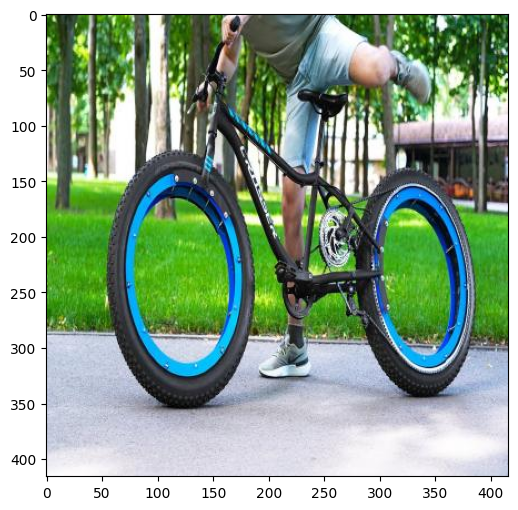

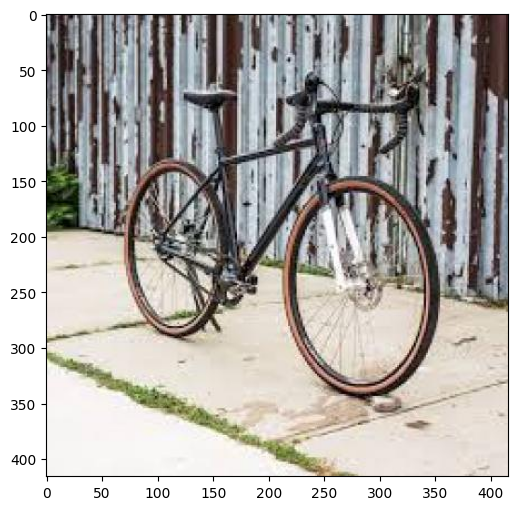

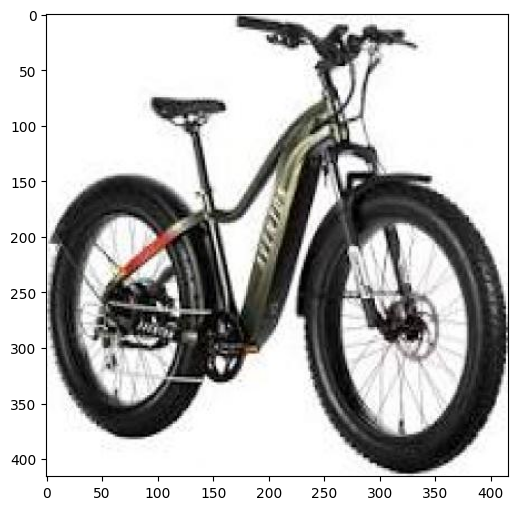

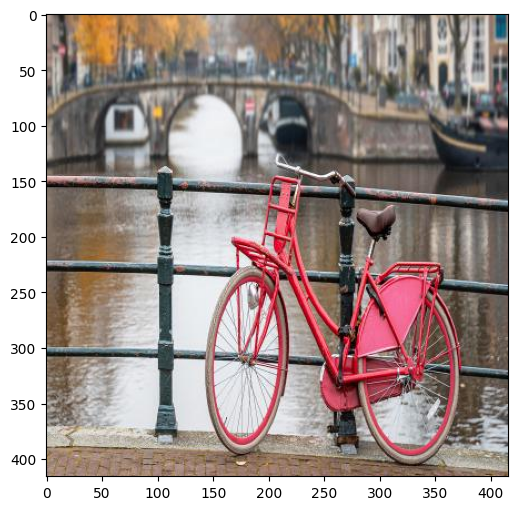

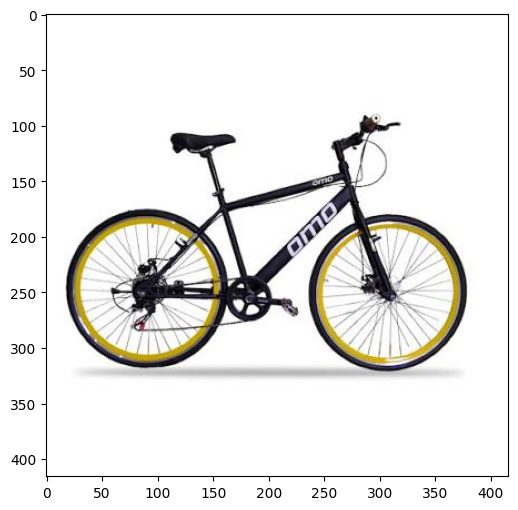

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import ipywidgets as widgets
from IPython.display import display, clear_output

def manual_labeling_colab2(image_path):
    img = Image.open(image_path)
    fig, ax = plt.subplots(1, figsize=(8, 6))
    ax.imshow(img)

    x_widget = widgets.IntText(value=50, description="X:")
    y_widget = widgets.IntText(value=50, description="Y:")
    w_widget = widgets.IntText(value=100, description="Lățime:")
    h_widget = widgets.IntText(value=100, description="Înălțime:")
    button = widgets.Button(description="Desenează")

    def draw_box2(_):
        clear_output(wait=True)
        display(x_widget, y_widget, w_widget, h_widget, button)
        fig, ax = plt.subplots(1, figsize=(8, 6))
        ax.imshow(img)
        x, y, w, h = x_widget.value, y_widget.value, w_widget.value, h_widget.value
        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='blue', facecolor='none')
        ax.add_patch(rect)
        display(fig)

    button.on_click(draw_box2)

    display(x_widget, y_widget, w_widget, h_widget, button)
    display(fig)

def process_images_in_colab2(folder="bikes_detected"):
    if not os.path.exists(folder):
        print(f"⚠️ Folderul {folder} nu există!")
        return

    images = [f for f in os.listdir(folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    if not images:
        print("Nu există imagini de procesat!")
        return

    for image_name in images:
        image_path = os.path.join(folder, image_name)
        print(f"Procesăm: {image_name}")
        manual_labeling_colab2(image_path)

process_images_in_colab2()


In [ ]:
#Calculam IoU (Intersection over unoin) - masoara suprapunerea dintre doua bounding box-uri
def calculate_iou(box1, box2):
    """
    Calculează Intersection over Union (IoU) între două bounding box-uri.
    Formatul bounding box-urilor: [x1, y1, x2, y2]
    """
    if len(box1) != 4 or len(box2) != 4:
        raise ValueError("Bounding box-urile trebuie să aibă formatul [x1, y1, x2, y2]")

    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)

    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])

    union = area1 + area2 - intersection

    iou = intersection / union if union != 0 else 0
    return iou



In [ ]:
manual_data = {
    "bike1.jpg": (2, 33, 407, 372),
    "bike06.jpg": (155, 140, 190, 265),
    "bike09.jpg": (5, 7, 375, 405),
    "bike07.jpg": (60, 180, 235, 240),
    "bike05.jpg": (68, 50, 285, 295)
}

In [ ]:
def evaluate_performance(folder="bikes_detected"):
    if not os.path.exists(folder):
        return

    images = os.listdir(folder)
    TP, FP, FN = 0, 0, 0
    iou_scores = []

    for image_name in images:
        image_path = os.path.join(folder, image_name)
        image = Image.open(image_path)
        draw = ImageDraw.Draw(image)

        azure_boxes = []
        with open(image_path, "rb") as image_file:
            analysis = computervision_client.analyze_image_in_stream(image_file, visual_features=["Objects"])
            for obj in analysis.objects:
                if obj.object_property.lower() in ["bicycle", "bike"]:
                    x, y, w, h = obj.rectangle.x, obj.rectangle.y, obj.rectangle.w, obj.rectangle.h
                    azure_boxes.append((x, y, w, h))

        if image_name in manual_data:
            if azure_boxes:
                iou = calculate_iou(azure_boxes[0], manual_data[image_name])
                iou_scores.append(iou)

                if iou >= 0.5:
                    TP += 1
                else:
                    FN += 1
            else:
                FN += 1
        else:
            if azure_boxes:
                FP += 1

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    mean_iou = np.mean(iou_scores) if iou_scores else 0

    print(f"True positive: {TP}")
    print(f"False positive: {FP}")
    print(f"False negative: {FN}")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"Mean IoU: {mean_iou:.2f}")

evaluate_performance()

True positive: 3
False positive: 4
False negative: 2
Precision: 0.43
Recall: 0.60
Mean IoU: 0.70
